# Transfer Learning Model Layer Output Visualisation

To understand how each of the layer in the transfer learning model extract features from the input images, each layer output from content & style layer are being plotted in this notebook.

In [3]:
%matplotlib inline
import matplotlib.pyplot as plt

import os, json
from glob import glob
import numpy as np

import keras

from tensorflow.keras import optimizers
from tensorflow.keras.layers import Input

from keras.applications import vgg19
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.applications.vgg19 import VGG19


from tensorflow.python.keras.preprocessing import image
from tensorflow.python.keras.preprocessing.image import ImageDataGenerator

from keras import models
from tensorflow.python.keras.models import Model,load_model,Sequential

from tensorflow.python.keras.layers import Dense, GlobalAveragePooling2D, Dropout,Flatten, Input, Conv2D, MaxPooling2D, Dropout, Flatten
from tensorflow.python.keras import backend as K

from tensorflow.keras.callbacks import ModelCheckpoint, Callback

from keras.preprocessing.image import load_img, img_to_array

import tensorflow as tf

Using TensorFlow backend.


In [4]:
#Define a function to show image
def imshow(image, title=None):
  plt.imshow(image)
  if title:
    plt.title(title)

#Define function to preprocess image
def preprocess_image(image_path, path = True):
  if path:
    img = load_img(image_path, target_size=(img_height, img_width))
    img = img_to_array(img)
  else:
    img = img_to_array(image_path)
  img = np.expand_dims(img, axis=0)
  img = vgg19.preprocess_input(img)
  return img

#Define function to deprocess tensor to image
def deprocess_image(x):
  x[:, :, 0] += 103.939
  x[:, :, 1] += 116.779
  x[:, :, 2] += 123.68
  x = x[:, :, ::-1]
  x = np.clip(x, 0, 255).astype('uint8')
  return x

In [5]:
#Initialise content & style images
target_image_path = './img/changjiang6.jpg'
style_reference_image_path = './img/shanshui2.jpg'
width, height = load_img(target_image_path).size
img_height, img_width = (512,512)

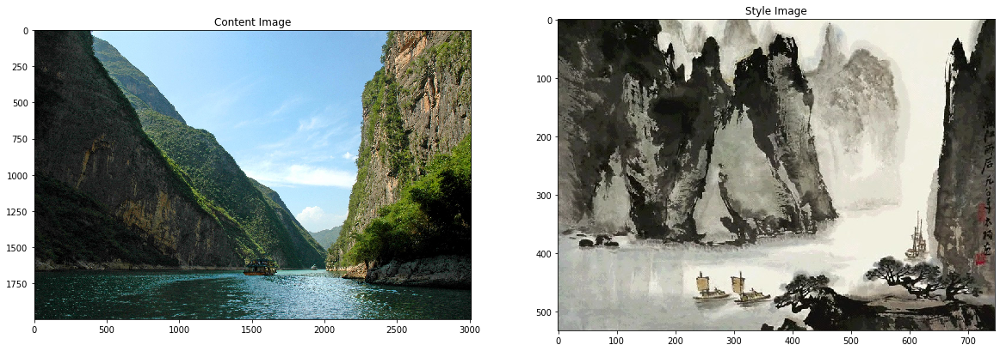

In [6]:
#load & plot images
content_image = load_img(target_image_path)
style_image = load_img(style_reference_image_path)

plt.figure(figsize=(20,10))
plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

In [7]:
#Load the trained model
model = load_model('./TL_Trained_Model/vgg19_1_model.h5')

In [8]:
#Model summary
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 512, 512, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 512, 512, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 512, 512, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 256, 256, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 256, 256, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 256, 256, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 128, 128, 128)     0   

In [9]:
#Select style and content layer
style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1',
                'block4_conv1',
                'block5_conv1',
                'conv2d_2']

content_layers = 'block4_conv2'

style_output = [layer.output for layer in model.layers if layer.name in style_layers]
content_output = [layer.output for layer in model.layers if layer.name in content_layers]

In [10]:
#Pre-process input images
style_img = preprocess_image(style_reference_image_path)
content_img = preprocess_image(target_image_path)

In [11]:
#Initialise model to get layer output
style_model = tf.keras.models.Model(inputs=model.input, outputs=style_output)
content_model = tf.keras.models.Model(inputs=model.input, outputs=content_output)

In [12]:
#Get output of model with .predict
activations_s = style_model.predict(style_img) 
activations_c = content_model.predict(content_img) 

In [13]:
#Show shape of each layer
print("Shape of each style layer:")
for i in activations_s:
  print(i.shape)
print('\n')
print("Shape of each content layer:")
for i in activations_c:
  print(i.shape)

Shape of each style layer:
(1, 512, 512, 64)
(1, 256, 256, 128)
(1, 128, 128, 256)
(1, 64, 64, 512)
(1, 32, 32, 512)
(1, 16, 16, 512)


Shape of each content layer:
(64, 64, 512)


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide


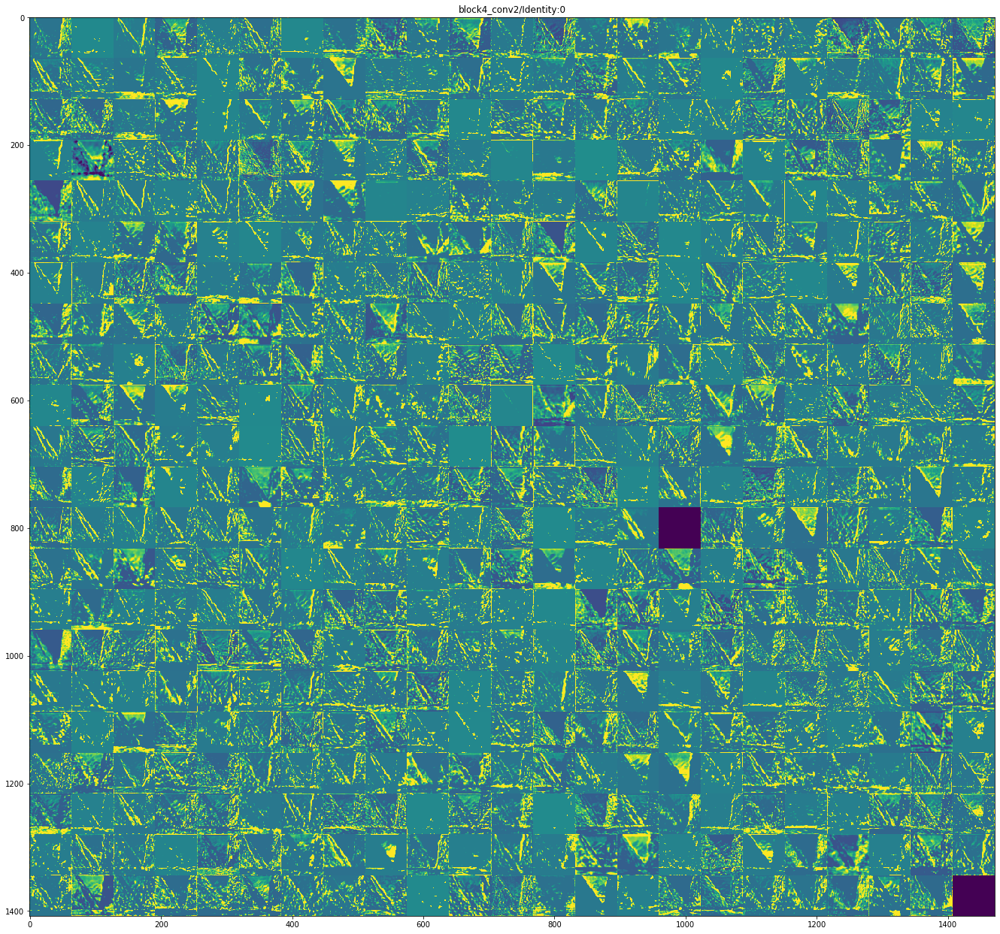

In [14]:
#Visualise layer output of content layer
layer_names = []
for layer in content_output:
    layer_names.append(layer.name) # Names of the layers, so you can have them as part of your plot
    
images_per_row = 23

for layer_name, layer_activation in zip(layer_names, activations_c): # Displays the feature maps
    n_features = layer_activation.shape[-1] # Number of features in the feature map
    size1 = layer_activation.shape[0] #The feature map has shape (1, size, size, n_features).
    size2 = layer_activation.shape[1]
    n_cols = n_features // images_per_row # Tiles the activation channels in this matrix
    display_grid = np.zeros((size1 * n_cols, images_per_row * size2))
    for col in range(n_cols): # Tiles each filter into a big horizontal grid
        for row in range(images_per_row):
            channel_image = layer_activation[:,:,col * images_per_row + row]
            channel_image -= channel_image.mean() # Post-processes the feature to make it visually palatable
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size1 : (col + 1) * size1, # Displays the grid
                         row * size2 : (row + 1) *size2] = channel_image
    scale = 1. / size1
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    plt.savefig('./img/Plot/' + layer_name[0:12] + '_content_output.png', dpi=150)


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide


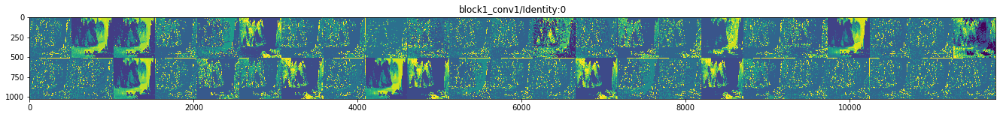

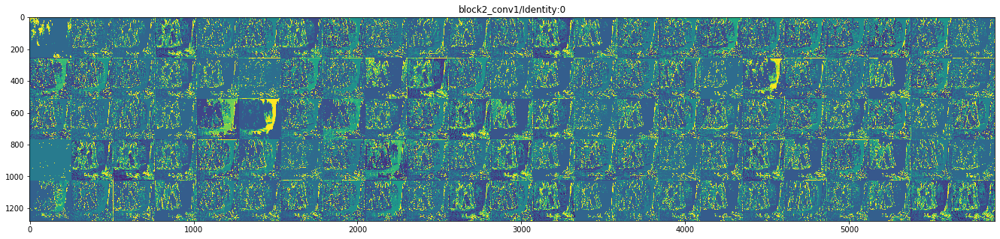

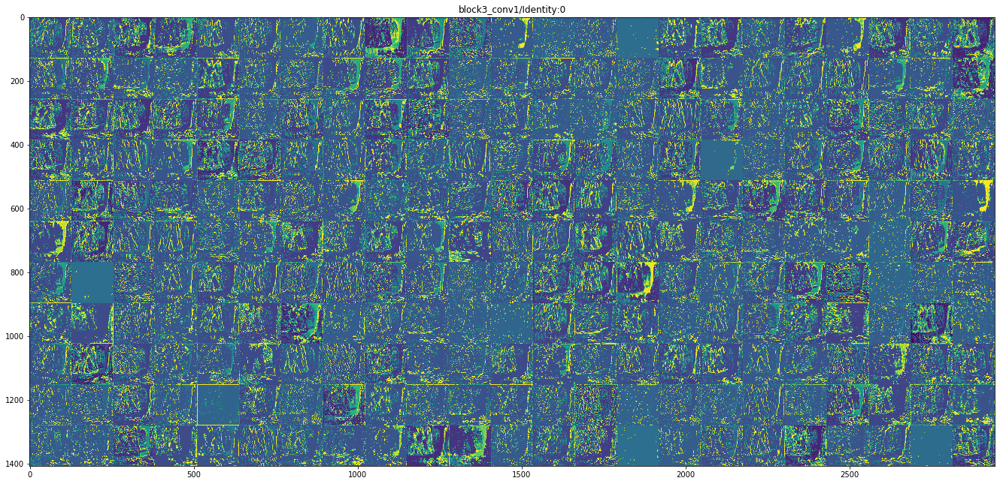

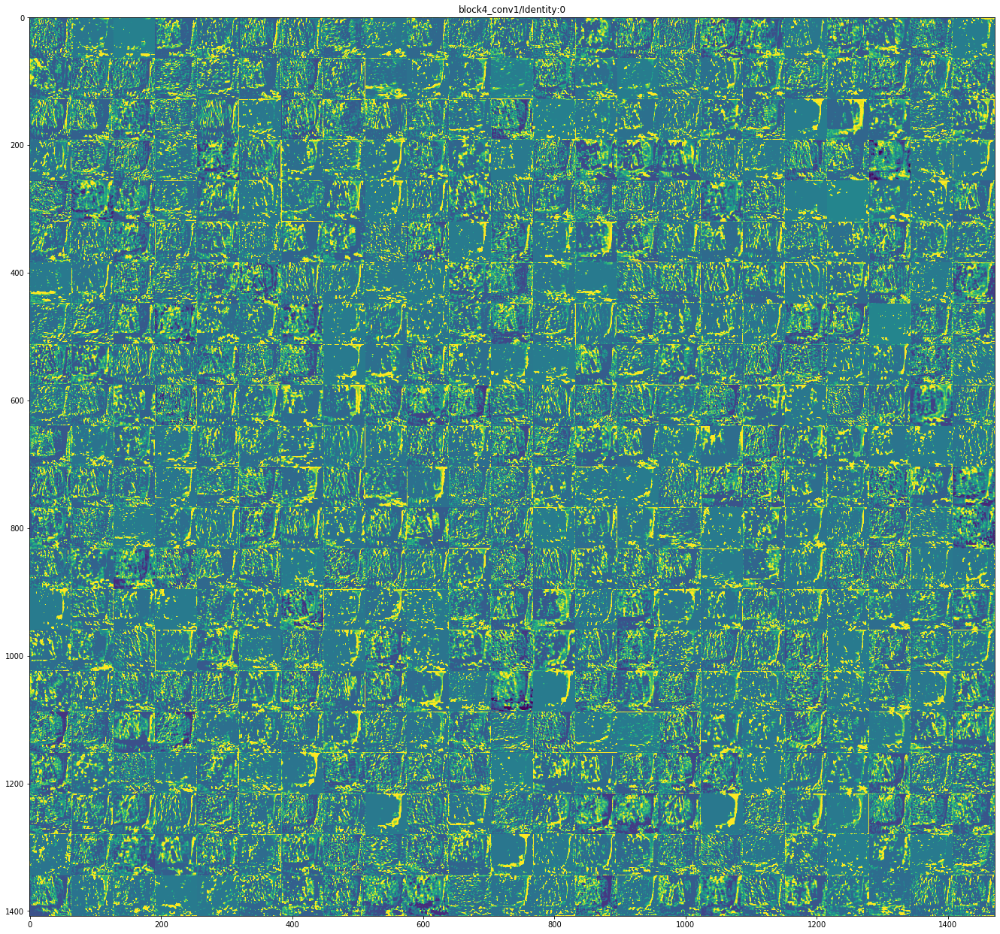

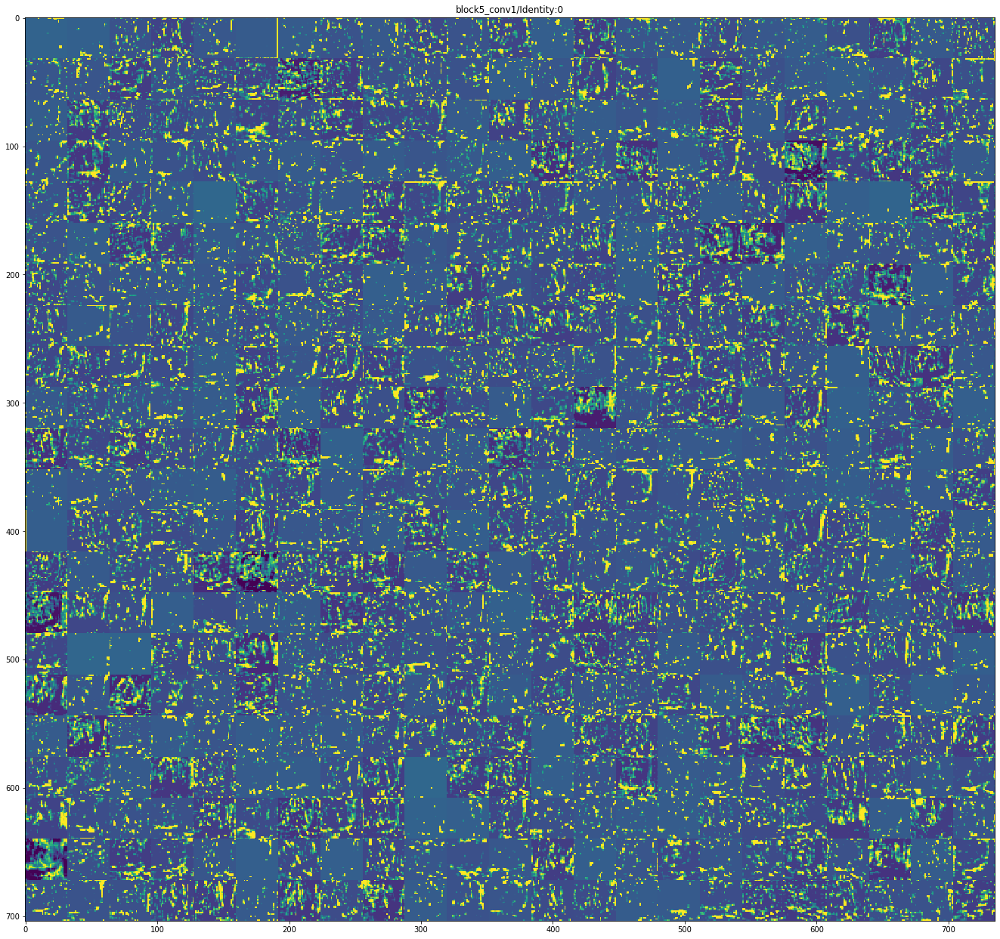

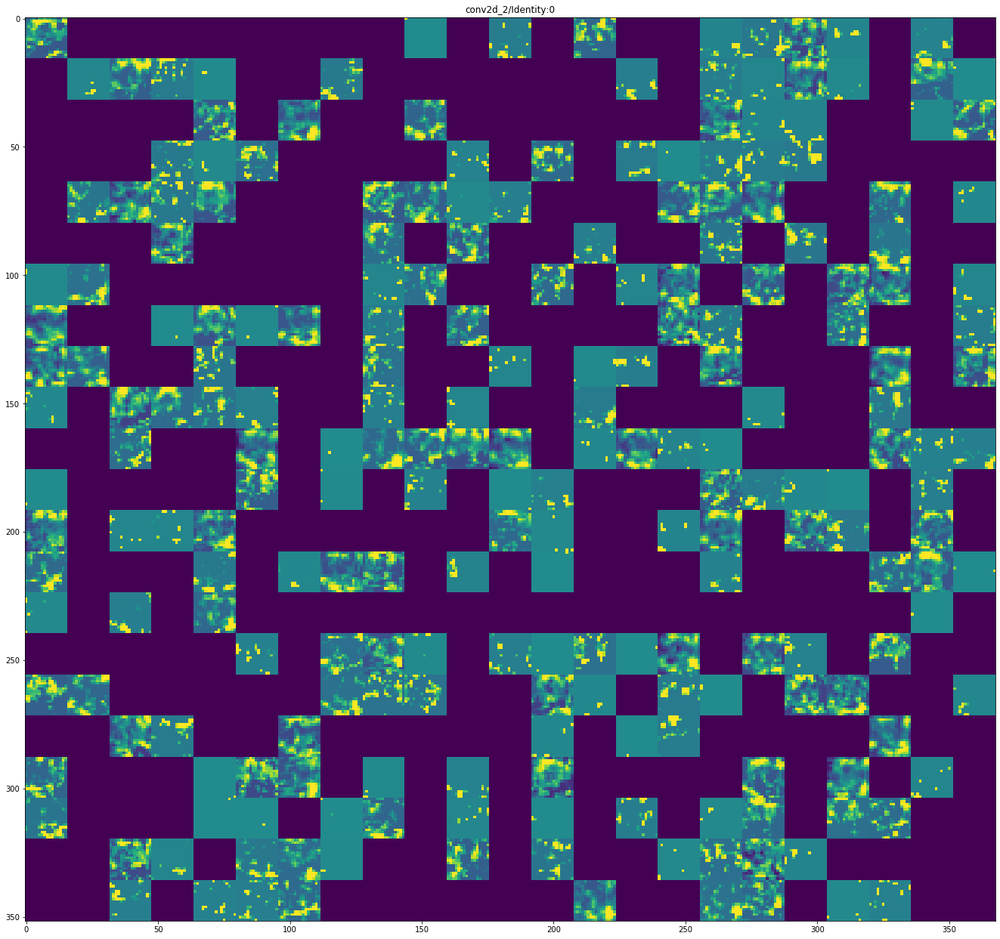

In [15]:
#Visualise layer output of style layers
layer_names = []
for layer in style_output:
    layer_names.append(layer.name) # Names of the layers, so you can have them as part of your plot
    
images_per_row = 23

for layer_name, layer_activation in zip(layer_names, activations_s): # Displays the feature maps
    n_features = layer_activation.shape[-1] # Number of features in the feature map
    size1 = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).
    size2 = layer_activation.shape[2]
    n_cols = n_features // images_per_row # Tiles the activation channels in this matrix
    display_grid = np.zeros((size1 * n_cols, images_per_row * size2))
    for col in range(n_cols): # Tiles each filter into a big horizontal grid
        for row in range(images_per_row):
            channel_image = layer_activation[0,:,:,col * images_per_row + row]
            channel_image -= channel_image.mean() # Post-processes the feature to make it visually palatable
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size1 : (col + 1) * size1, # Displays the grid
                         row * size2 : (row + 1) *size2] = channel_image
    scale = 1. / size1
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    if layer_name[0:12] == 'conv2d_2/Ide':
        plt.savefig('./img/Plot/' + layer_name[0:8] + '_style_output.png')
    else:
        plt.savefig('./img/Plot/' + layer_name[0:12] + '_style_output.png', dpi=150)
